In [35]:
import random
import json, pickle
import re
import os

from pathlib import Path

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix

random.seed(6)
np.random.seed(6)

WORK_DIR = Path.cwd().parent


In [36]:
import sys
sys.path.append(str(WORK_DIR))
from src.datasets import STARDataset
from src import prompt_formatters
from src.STAR_utils.visualization_tools import qa_visualization as qaviz


In [37]:
RAW_VIDEO_DIR = Path(WORK_DIR / 'data/datasets/action-genome/Charades_v1_480/')
RAW_FRAME_DIR = Path(WORK_DIR / 'data/datasets/action-genome/frames/')
ANNOTATION_DIR = Path(WORK_DIR / 'src/STAR_utils/annotations/STAR_classes/')
FPS = pickle.load(open(ANNOTATION_DIR / 'video_fps','rb'))

SAVE_VIDEO_DIR = Path(WORK_DIR / "experiments/video_dump")


# Experiment - Gemma3 4b it-qat

Analysis on the performance of Gemma3 4b instruction tuned quantization aware training on the scene graphs generated by the VLM.

**Parameters:**
- model: Gemma3 4b instruction-tuned quantization-aware-training
- system prompt: MCQ_system_promtp_ZS_CoT.txt
- user_prompt: MCQ_user_prompt_ZS_CoT_v2.txt
- temperature: 0.1
- sampling method: (default) top-p (p=0.9)


## Prompts

In [38]:
with open(WORK_DIR / 'data/prompts/zero-shot-cot/MCQ_system_prompt_ZS_CoT.txt', 'r') as f:
    pr = f.read()

print(pr)


You need to respond to reasoning questions by making logical inference on sequence of Scene-Graphs extracted from frames belonging to a video, called a Spatio-Temporal Scene Graph.

IMPORTANT CLARIFICATIONS:
- You will receive a question and Spatio-Temporal Scene-Graph
- Each Scene-Graph is a static symbolic representation of the scene unfolding in the frame
- The Scene-Graphs are ordered chronologically
- The Scene-Graph is represented as a set of tuple in the format: subject - relationship - object
- The Spatio-Temporal Scene-Graph is a cornologically sorted list of Scene-Graphs

INSTRUCTIONS:
- Read the entire Spatio-Temporal Scene-Graphs in chronological order and pay attention at the order of how events unfold.
- Read the question and reason about the answer step by step.
- In your answer include key events or relationships that help you in determing the correct answer.
- Be careful to reproduce the chosen alternative as it is presented.


In [39]:
with open(WORK_DIR / "data/prompts/zero-shot-cot/MCQ_user_prompt_ZS_CoT_v3.txt", 'r') as f:
    pr = f.read()

print(pr)


Please carefully read the following Spatio-Temporal Scene Graph delimited by the <STSG> tags and provide an answer to the question below:

<STSG>
{stsg}
</STSG>

Given the following question:
<Q>
{question}
<Q>

And the following alternatives:
<Alternatives>
A. {c1}
B. {c2}
C. {c3}
D. {c4}
</Alternatives>

Provide an answer to the above question reasoning step by step on the Spatio-Temporal Scene-Graph (STSG) and choosing one of the alternatives. 

In answering the question please be sure to operate according to the following guidlines:
1. Question Interpretation: Clearly state what the question is asking
2. STSG Analysis: Carefully examine the spatial and temporal relationships in the scene graph
3. Alternative Evaluation: For each option (A, B, C, D), explain whether it matches the STSG evidence
4. Reasoning: Provide clear logical step by step reasoning leading to your conclusion
5. Conclusion: Declare the logical conclusion to your reasoning in the above step
6. Consistency Check: B

In [40]:
with open(WORK_DIR / "data/prompts/zero-shot-cot/auto_reply_ZS_CoT.txt", 'r') as f:
    reply = f.read()

print(reply)


Therefore the final answer is?

Your response must be provided in valid JSON format as follows:
{"answer": "your complete answer here"}

IMPORTANT: Always include both the letter (A, B, C, D, etc.) AND the full text of the answer in your response.
Do not abbreviate or shorten the answer. For example, if the correct answer is "A. the laptop", your response 
should be {"answer": "A. the laptop"}, not {"answer": "laptop"} or {"answer": "A"}.\



Let's load the ground truth from the `STAR_QA_question_and_stsg_val.json` file where we extracted QA and spatio-temporal scene graphs

In [41]:
ground_truth = []

with open(WORK_DIR / 'data/datasets/STAR_QA_and_stsg_val.json') as f:
    data = json.load(f)
    ground_truth = [{
        'id': sample['question_id'],
        'question': sample['question'],
        'choices': sample['choices'],
        'num': sample['answer'],
        'text': sample['choices'][str(sample['answer'])]
    } for sample in data]


# we keep num as str so we can directrly access choices dictionaries
gt_df = pd.DataFrame(ground_truth).astype({'id': 'string', 'num': 'string', 'text': 'string'})
gt_df.set_index('id', inplace=True)
gt_df


,question,choices,num,text
id,,,,
Interaction_T1_13,Which object was tidied up by the person?,"{'0': 'The closet/cabinet.', '1': 'The blanket...",2,The clothes.
Interaction_T1_14,Which object was tidied up by the person?,"{'0': 'The blanket.', '1': 'The table.', '2': ...",2,The clothes.
Interaction_T1_31,Which object was thrown by the person?,"{'0': 'The pillow.', '1': 'The bag.', '2': 'Th...",2,The clothes.
Interaction_T1_32,Which object was put down by the person?,"{'0': 'The food.', '1': 'The shoe.', '2': 'The...",1,The shoe.
Interaction_T1_40,Which object was tidied up by the person?,"{'0': 'The broom.', '1': 'The closet/cabinet.'...",1,The closet/cabinet.
...,...,...,...,...
Feasibility_T6_1453,What is the person able to do after taking the...,"{'0': 'Wash the table.', '1': 'Take the box.',...",0,Wash the table.
Feasibility_T6_1454,What is the person able to do after walking th...,"{'0': 'Take the towel.', '1': 'Throw the bag.'...",0,Take the towel.
Feasibility_T6_1455,What is the person able to do after walking th...,"{'0': 'Throw the bag.', '1': 'Wash the table.'...",1,Wash the table.


## Loading predicted answers evaluation

In [42]:
predictions = []
with open(WORK_DIR / 'outputs/responses_to_genframes_gemma3:4b-it-qat_20250605_00:00:00.jsonl', mode='r', encoding='utf-8', errors='strict') as f:
    predictions = [json.loads(line) for line in f.readlines()]

# transforming the id key from `qid` to `id` for consistency and `response` to `answer`
predictions_df = pd.DataFrame(predictions, dtype='string').rename(columns={'qid':'id', 'response':'answer'})
predictions_df.set_index('id', inplace=True)
predictions_df


,chat_history
id,
Interaction_T1_14,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_31,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_32,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_40,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_43,"[{'role': 'user', 'content': 'Please carefully..."
...,...
Feasibility_T6_1104,"[{'role': 'user', 'content': 'Please carefully..."
Feasibility_T6_1263,"[{'role': 'user', 'content': 'Please carefully..."
Feasibility_T6_1267,"[{'role': 'user', 'content': 'Please carefully..."


In [43]:
predictions_df['chat_history'] = \
    predictions_df['chat_history'] \
    .apply(lambda x: eval(x))

predictions_df


,chat_history
id,
Interaction_T1_14,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_31,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_32,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_40,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_43,"[{'role': 'user', 'content': 'Please carefully..."
...,...
Feasibility_T6_1104,"[{'role': 'user', 'content': 'Please carefully..."
Feasibility_T6_1263,"[{'role': 'user', 'content': 'Please carefully..."
Feasibility_T6_1267,"[{'role': 'user', 'content': 'Please carefully..."


In [44]:
predictions_df['reasoning'] = predictions_df['chat_history'].apply(lambda x: x[1]['content'])
predictions_df['answer'] = predictions_df['chat_history'].apply(lambda x: x[-1]['content'])


In [45]:
predictions_df['reasoning'].iloc[0:5] 


id
Interaction_T1_14    Okay, let's analyze the scene graph and answer...
Interaction_T1_31    Okay, let's analyze the scene graph and answer...
Interaction_T1_32    Okay, let's analyze the scene graph and answer...
Interaction_T1_40    Okay, let's analyze the scene graph and answer...
Interaction_T1_43    Okay, let's analyze the scene graph and answer...
Name: reasoning, dtype: object

In [46]:
predictions_df['answer'].iloc[0:5] 


id
Interaction_T1_14          ```json\n{"answer": "A. The blanket."}\n```
Interaction_T1_31           ```json\n{"answer": "A. The pillow."}\n```
Interaction_T1_32           ```json\n{"answer": "C. The blanket"}\n```
Interaction_T1_40    ```json\n{"answer": "B. The closet/cabinet."}\...
Interaction_T1_43    ```json\n{"answer": "None of the alternatives ...
Name: answer, dtype: object

## Text preprocessing

For Gemma we need to be more careful becuase the format is different, it encapsulated the json output in the with the tokens: 
```
```json\n
<actual_answer>
\n```
```

In [47]:

# Create mask for answers that follow JSON syntax
json_mask = predictions_df['answer'].str.match(r'^(```json\s)?({[^}]+})(\s```)?$')
matches_json_template = json_mask.sum()

print(f"Total answers: {len(predictions_df)}")
print(f"Answers following JSON template: {matches_json_template}")
print(f"Percentage following JSON template: {(matches_json_template/len(predictions_df))*100:.2f}%")


Total answers: 1694
Answers following JSON template: 1694
Percentage following JSON template: 100.00%


In [48]:
predictions_df.loc[~json_mask, 'answer']


Series([], Name: answer, dtype: object)

In [49]:
predictions_df.loc[json_mask, 'answer'] = \
    predictions_df.loc[json_mask, 'answer'] \
    .apply(lambda x: re.search(r'^(?:```json\s)?({[^}]+})(?:\s```)?$', x).group(1))

predictions_df.loc[~json_mask, 'answer'] = ""
predictions_df['answer']


id
Interaction_T1_14                          {"answer": "A. The blanket."}
Interaction_T1_31                           {"answer": "A. The pillow."}
Interaction_T1_32                           {"answer": "C. The blanket"}
Interaction_T1_40                   {"answer": "B. The closet/cabinet."}
Interaction_T1_43      {"answer": "None of the alternatives can be se...
                                             ...                        
Feasibility_T6_1104                    {"answer": "C. Sit on the floor"}
Feasibility_T6_1263                      {"answer": "C. Take the food."}
Feasibility_T6_1267        {"answer": "B. Put down the paper/notebook."}
Feasibility_T6_1326                   {"answer": "C. Put down the shoe"}
Feasibility_T6_1453                       {"answer": "D. Open the bag."}
Name: answer, Length: 1694, dtype: object

### Applying changes

In [50]:
# Replace new line (lead to EOF Errors) with whitespace
predictions_df['answer'] = \
    predictions_df['answer'].str.replace('\n+', ' ', regex=True)

# Replace lef and right quotation mark with simple quotation mark
predictions_df['answer'] = \
    predictions_df['answer'].str.replace('[\u2018-\u201b]', '\'', regex=True)
predictions_df['answer'] = \
    predictions_df['answer'].str.replace('[\u201c\u201d]', '"', regex=True)
# ------------------ Removing inner double quotes --------------------
# It may happen that the text may contain inner double quotes before the
# attribute end. This will cause the parser to termiate early and spout
# errors for the remaining text. With this snippet we replace those inner
# double quotes with single quotes.
#  
# we first match the text of the reason paramter inside the double quotes
# then we escape/replace all the double quotes inside the text
inside_doublequotes = r"(?<=\"answer\": \")(.*)(?=\"(?:,|}))"

predictions_df['answer'] = \
    predictions_df.apply(
        func=lambda row: re.sub(
            inside_doublequotes, 
            lambda matchobj: matchobj.group(0).replace('\"', ''), 
            row['answer']),
        axis=1
        )


In [51]:
predictions_df.loc[json_mask, 'answer'] = predictions_df.loc[json_mask, 'answer'].apply(lambda x: eval(x)['answer'].strip())
predictions_df


,chat_history,reasoning,answer
id,,,
Interaction_T1_14,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the scene graph and answer...",A. The blanket.
Interaction_T1_31,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the scene graph and answer...",A. The pillow.
Interaction_T1_32,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the scene graph and answer...",C. The blanket
Interaction_T1_40,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the scene graph and answer...",B. The closet/cabinet.
Interaction_T1_43,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the scene graph and answer...",None of the alternatives can be selected as th...
...,...,...,...
Feasibility_T6_1104,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the scene graph and answer...",C. Sit on the floor
Feasibility_T6_1263,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the scene graph and answer...",C. Take the food.
Feasibility_T6_1267,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the scene graph and answer...",B. Put down the paper/notebook.


In [52]:
ans_regex_pattern = r'^(?:[A-Z]\.)\s+((?:\w+(?:\s|\/)?){,10}\.?)'
contains_answer = predictions_df['answer'].str.contains(ans_regex_pattern, regex=True)

print(f"Answer following the template: {contains_answer.value_counts()[True]}\n"
      f"{contains_answer.value_counts()[True]/predictions_df.shape[0]:.2%} of the total")

print(f"\nOnly {contains_answer.value_counts()[False]} samples do not contain the answer in the response with the specified format")


Answer following the template: 1246
73.55% of the total

Only 448 samples do not contain the answer in the response with the specified format


/tmp/ipykernel_1543150/3127831504.py:2: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  contains_answer = predictions_df['answer'].str.contains(ans_regex_pattern, regex=True)


In [53]:
predictions_df.loc[~contains_answer, 'answer']


id
Interaction_T1_43     None of the alternatives can be selected as th...
Interaction_T1_70     None of the alternatives are correct. There is...
Interaction_T1_76                 None of the alternatives are correct.
Interaction_T1_235    None of the alternatives are supported by the ...
Interaction_T1_264    None of the alternatives are supported by the ...
                                            ...                        
Feasibility_T2_774    None of the alternatives can be definitively s...
Feasibility_T2_782    None of the alternatives can be supported by t...
Feasibility_T2_860    None of the provided alternatives accurately d...
Feasibility_T2_995    None of the alternatives can be definitively c...
Feasibility_T6_621    None of the alternatives accurately describe a...
Name: answer, Length: 448, dtype: object

## Extract answers

In [54]:
ans_df = \
    predictions_df[contains_answer]['answer'] \
    .apply(lambda x: re.findall(ans_regex_pattern, x)[-1]) \
    .apply(lambda x: x + '.' if not x.endswith('.') else x) \
    .to_frame(name='text')

ans_df.rename(columns={0: 'text'}, inplace=True)

ans_df['text'] = ans_df['text'].str.strip()
ans_df['text'] = ans_df['text'].str.lower()
ans_df['reasoning'] = predictions_df['reasoning']
ans_gen_stsg_df = ans_df
ans_gen_stsg_df


,text,reasoning
id,,
Interaction_T1_14,the blanket.,"Okay, let's analyze the scene graph and answer..."
Interaction_T1_31,the pillow.,"Okay, let's analyze the scene graph and answer..."
Interaction_T1_32,the blanket.,"Okay, let's analyze the scene graph and answer..."
Interaction_T1_40,the closet/cabinet.,"Okay, let's analyze the scene graph and answer..."
Interaction_T1_71,the paper/notebook.,"Okay, let's analyze the scene graph and answer..."
...,...,...
Feasibility_T6_1104,sit on the floor.,"Okay, let's analyze the scene graph and answer..."
Feasibility_T6_1263,take the food.,"Okay, let's analyze the scene graph and answer..."
Feasibility_T6_1267,put down the paper/notebook.,"Okay, let's analyze the scene graph and answer..."


In [55]:
ans_df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 1246 entries, Interaction_T1_14 to Feasibility_T6_1453
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   text       1246 non-null   object
 1   reasoning  1246 non-null   object
dtypes: object(2)
memory usage: 29.2+ KB


In [56]:
# Inner join - keeps only indices present in both series

ans_df_tmp = ans_df.rename(columns={'text': 'pred_text'})
eval_df = gt_df.join(
    ans_df_tmp, 
    how='inner' # we account also for samples without answers
)

eval_df.shape


(1246, 6)

In [57]:
def accuracy(eval_df, on_what='text'):
    hits_text = (eval_df[f'pred_{on_what}'].str.lower() == eval_df[on_what].str.lower()).sum()
    

    return hits_text/eval_df.shape[0]


In [58]:
def print_acc(eval_df, acc_fn):
    print(f"{'Question type':<15}{'Total':^15}{'Accuracy':^10}\n")

    total = eval_df.index.str.startswith('Interaction').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Interaction')])
    print(f"{'Interaction':<15}{total:^15}{acc:^10.2%}")

    total = eval_df.index.str.startswith('Sequence').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Sequence')])
    print(f"{'Sequence':<15}{total:^15}{acc:^10.2%}")

    total = eval_df.index.str.startswith('Prediction').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Prediction')])
    print(f"{'Prediction':<15}{total:^15}{acc:^10.2%}")

    total = eval_df.index.str.startswith('Feasibility').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Feasibility')])
    print(f"{'Feasibility':<15}{total:^15}{acc:^10.2%}")


In [59]:
print_acc(eval_df, lambda x: accuracy(x, on_what='text'))


Question type       Total      Accuracy 

Interaction         1182        43.91%  
Sequence              6         50.00%  
Prediction            0          nan%   
Feasibility          58         39.66%  


/tmp/ipykernel_1543150/3786578470.py:5: RuntimeWarning: invalid value encountered in scalar divide
  return hits_text/eval_df.shape[0]


In [60]:
# % of answers conforming to template per category

def print_ans_perc(eval_df, gt_df):
    print(f"{'Question type':<15}{'Total':^15}{'Answered':^10}\n")

    total = gt_df.index.str.startswith('Interaction').sum()
    acc = len(gt_df.index.intersection(eval_df[eval_df.index.str.startswith('Interaction')].index))/total
    print(f"{'Interaction':<15}{total:^15}{acc:^10.2%}")

    total = gt_df.index.str.startswith('Sequence').sum()
    acc = len(gt_df.index.intersection(eval_df[eval_df.index.str.startswith('Sequence')].index))/total
    print(f"{'Sequence':<15}{total:^15}{acc:^10.2%}")

    total = gt_df.index.str.startswith('Prediction').sum()
    acc = len(gt_df.index.intersection(eval_df[eval_df.index.str.startswith('Prediction')].index))/total
    print(f"{'Prediction':<15}{total:^15}{acc:^10.2%}")

    total = gt_df.index.str.startswith('Feasibility').sum()
    acc = len(gt_df.index.intersection(eval_df[eval_df.index.str.startswith('Feasibility')].index))/total
    print(f"{'Feasibility':<15}{total:^15}{acc:^10.2%}")

    total = gt_df.shape[0]
    acc = eval_df.shape[0]/total
    print(f"{'Overall':<15}{total:^15}{acc:^10.2%}")

print_ans_perc(eval_df, gt_df)


Question type       Total      Answered 

Interaction         2398        49.29%  
Sequence            3586        0.17%   
Prediction           624        0.00%   
Feasibility          490        11.84%  
Overall             7098        17.55%  


## Loading predicted answers - ground truth stsg as input

In [61]:
predictions = []
with open(WORK_DIR / 'outputs/responses_gemma3:4b_20250323_20:38:00.jsonl', mode='r', encoding='utf-8', errors='strict') as f:
    predictions = [json.loads(line) for line in f.readlines()]

# transforming the id key from `qid` to `id` for consistency and `response` to `answer`
predictions_df = pd.DataFrame(predictions, dtype='string').rename(columns={'qid':'id', 'response':'answer'})
predictions_df.set_index('id', inplace=True)
predictions_df



,chat_history
id,
Interaction_T1_13,"[{'role': 'user', 'content': ""Please carefully..."
Interaction_T1_14,"[{'role': 'user', 'content': ""Please carefully..."
Interaction_T1_31,"[{'role': 'user', 'content': ""Please carefully..."
Interaction_T1_32,"[{'role': 'user', 'content': ""Please carefully..."
Interaction_T1_40,"[{'role': 'user', 'content': ""Please carefully..."
...,...
Feasibility_T6_1453,"[{'role': 'user', 'content': ""Please carefully..."
Feasibility_T6_1454,"[{'role': 'user', 'content': ""Please carefully..."
Feasibility_T6_1455,"[{'role': 'user', 'content': ""Please carefully..."


In [62]:
predictions_df['chat_history'] = \
    predictions_df['chat_history'] \
    .apply(lambda x: eval(x))

predictions_df


,chat_history
id,
Interaction_T1_13,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_14,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_31,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_32,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_40,"[{'role': 'user', 'content': 'Please carefully..."
...,...
Feasibility_T6_1453,"[{'role': 'user', 'content': 'Please carefully..."
Feasibility_T6_1454,"[{'role': 'user', 'content': 'Please carefully..."
Feasibility_T6_1455,"[{'role': 'user', 'content': 'Please carefully..."


In [63]:
predictions_df['reasoning'] = predictions_df['chat_history'].apply(lambda x: x[1]['content'])
predictions_df['answer'] = predictions_df['chat_history'].apply(lambda x: x[-1]['content'])


In [64]:
predictions_df['reasoning'].iloc[0:5] 


id
Interaction_T1_13    Okay, let's analyze the Spatio-Temporal Scene ...
Interaction_T1_14    Let's analyze the Spatio-Temporal Scene Graph ...
Interaction_T1_31    Let's analyze the Spatio-Temporal Scene Graph ...
Interaction_T1_32    Let's analyze the STSG to determine which obje...
Interaction_T1_40    Let's analyze the STSG to determine which obje...
Name: reasoning, dtype: object

In [65]:
predictions_df['answer'].iloc[0:5] 


id
Interaction_T1_13     ```json\n{"answer": "C. The clothes"}\n```
Interaction_T1_14    ```json\n{"answer": "C. The clothes."}\n```
Interaction_T1_31     ```json\n{"answer": "C. The clothes"}\n```
Interaction_T1_32       ```json\n{"answer": "B. The shoe."}\n```
Interaction_T1_40    ```json\n{"answer": "C. The blanket."}\n```
Name: answer, dtype: object

## Text preprocessing

For Gemma we need to be more careful becuase the format is different, it encapsulated the json output in the with the tokens: 
```
```json\n
<actual_answer>
\n```
```

In [66]:

# Create mask for answers that follow JSON syntax
json_mask = predictions_df['answer'].str.match(r'^(```json\s)?({[^}]+})(\s```)?$')
matches_json_template = json_mask.sum()

print(f"Total answers: {len(predictions_df)}")
print(f"Answers following JSON template: {matches_json_template}")
print(f"Percentage following JSON template: {(matches_json_template/len(predictions_df))*100:.2f}%")


Total answers: 7098
Answers following JSON template: 7097
Percentage following JSON template: 99.99%


In [67]:
predictions_df.loc[~json_mask, 'answer']


id
Prediction_T4_1351    ```json\n{"answer": "Therefore the final answe...
Name: answer, dtype: object

In [68]:
predictions_df.loc[json_mask, 'answer'] = \
    predictions_df.loc[json_mask, 'answer'] \
    .apply(lambda x: re.search(r'^(?:```json\s)?({[^}]+})(?:\s```)?$', x).group(1))

predictions_df.loc[~json_mask, 'answer'] = ""
predictions_df['answer']


id
Interaction_T1_13          {"answer": "C. The clothes"}
Interaction_T1_14         {"answer": "C. The clothes."}
Interaction_T1_31          {"answer": "C. The clothes"}
Interaction_T1_32            {"answer": "B. The shoe."}
Interaction_T1_40         {"answer": "C. The blanket."}
                                     ...               
Feasibility_T6_1453    {"answer": "A. Wash the table."}
Feasibility_T6_1454     {"answer": "A. Take the towel"}
Feasibility_T6_1455    {"answer": "B. Wash the table."}
Feasibility_T6_1456    {"answer": "D. Wash the table."}
Feasibility_T6_1468      {"answer": "B. Hold the food"}
Name: answer, Length: 7098, dtype: object

### Applying changes

In [69]:
# Replace new line (lead to EOF Errors) with whitespace
predictions_df['answer'] = \
    predictions_df['answer'].str.replace('\n+', ' ', regex=True)

# Replace lef and right quotation mark with simple quotation mark
predictions_df['answer'] = \
    predictions_df['answer'].str.replace('[\u2018-\u201b]', '\'', regex=True)
predictions_df['answer'] = \
    predictions_df['answer'].str.replace('[\u201c\u201d]', '"', regex=True)
# ------------------ Removing inner double quotes --------------------
# It may happen that the text may contain inner double quotes before the
# attribute end. This will cause the parser to termiate early and spout
# errors for the remaining text. With this snippet we replace those inner
# double quotes with single quotes.
#  
# we first match the text of the reason paramter inside the double quotes
# then we escape/replace all the double quotes inside the text
inside_doublequotes = r"(?<=\"answer\": \")(.*)(?=\"(?:,|}))"

predictions_df['answer'] = \
    predictions_df.apply(
        func=lambda row: re.sub(
            inside_doublequotes, 
            lambda matchobj: matchobj.group(0).replace('\"', ''), 
            row['answer']),
        axis=1
        )


In [70]:
predictions_df.loc[json_mask, 'answer'] = predictions_df.loc[json_mask, 'answer'].apply(lambda x: eval(x)['answer'].strip())
predictions_df


,chat_history,reasoning,answer
id,,,
Interaction_T1_13,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the Spatio-Temporal Scene ...",C. The clothes
Interaction_T1_14,"[{'role': 'user', 'content': 'Please carefully...",Let's analyze the Spatio-Temporal Scene Graph ...,C. The clothes.
Interaction_T1_31,"[{'role': 'user', 'content': 'Please carefully...",Let's analyze the Spatio-Temporal Scene Graph ...,C. The clothes
Interaction_T1_32,"[{'role': 'user', 'content': 'Please carefully...",Let's analyze the STSG to determine which obje...,B. The shoe.
Interaction_T1_40,"[{'role': 'user', 'content': 'Please carefully...",Let's analyze the STSG to determine which obje...,C. The blanket.
...,...,...,...
Feasibility_T6_1453,"[{'role': 'user', 'content': 'Please carefully...",Let's analyze the Spatio-Temporal Scene Graph ...,A. Wash the table.
Feasibility_T6_1454,"[{'role': 'user', 'content': 'Please carefully...",Let's analyze the scene graph to understand th...,A. Take the towel
Feasibility_T6_1455,"[{'role': 'user', 'content': 'Please carefully...",Let's analyze the STSG to determine what the p...,B. Wash the table.


In [71]:
ans_regex_pattern = r'^(?:[A-Z]\.)\s+((?:\w+(?:\s|\/)?){,10}\.?)'
contains_answer = predictions_df['answer'].str.contains(ans_regex_pattern, regex=True)

print(f"Answer following the template: {contains_answer.value_counts()[True]}\n"
      f"{contains_answer.value_counts()[True]/predictions_df.shape[0]:.2%} of the total")

print(f"\nOnly {contains_answer.value_counts()[False]} samples do NOT contain the answer in the response with the specified format")


Answer following the template: 6778
95.49% of the total

Only 320 samples do NOT contain the answer in the response with the specified format


/tmp/ipykernel_1543150/1875602683.py:2: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  contains_answer = predictions_df['answer'].str.contains(ans_regex_pattern, regex=True)


In [72]:
predictions_df.loc[~contains_answer, 'answer']


id
Interaction_T1_198     None of the alternatives are correct based on ...
Interaction_T1_1255                None of the alternatives are correct.
Interaction_T1_1369                None of the alternatives are correct.
Interaction_T1_1671    None of the alternatives can be determined fro...
Interaction_T1_2509    None of the alternatives are correct based on ...
                                             ...                        
Feasibility_T6_448                                     None of the above
Feasibility_T6_1063    None of the alternatives are correct. The grap...
Feasibility_T6_1091    None of the alternatives are correct based on ...
Feasibility_T6_1153    None of the alternatives are correct based on ...
Feasibility_T6_1344    None of the provided alternatives accurately d...
Name: answer, Length: 320, dtype: object

## Extract answers

In [73]:
ans_df = \
    predictions_df[contains_answer]['answer'] \
    .apply(lambda x: re.findall(ans_regex_pattern, x)[-1]) \
    .apply(lambda x: x + '.' if not x.endswith('.') else x) \
    .to_frame(name='text')

ans_df.rename(columns={0: 'text'}, inplace=True)

ans_df['text'] = ans_df['text'].str.strip()
ans_df['text'] = ans_df['text'].str.lower()
ans_df['reasoning'] = predictions_df['reasoning']
ans_gt_stsg_df = ans_df
ans_gt_stsg_df


,text,reasoning
id,,
Interaction_T1_13,the clothes.,"Okay, let's analyze the Spatio-Temporal Scene ..."
Interaction_T1_14,the clothes.,Let's analyze the Spatio-Temporal Scene Graph ...
Interaction_T1_31,the clothes.,Let's analyze the Spatio-Temporal Scene Graph ...
Interaction_T1_32,the shoe.,Let's analyze the STSG to determine which obje...
Interaction_T1_40,the blanket.,Let's analyze the STSG to determine which obje...
...,...,...
Feasibility_T6_1453,wash the table.,Let's analyze the Spatio-Temporal Scene Graph ...
Feasibility_T6_1454,take the towel.,Let's analyze the scene graph to understand th...
Feasibility_T6_1455,wash the table.,Let's analyze the STSG to determine what the p...


In [74]:
ans_gen_stsg_df


,text,reasoning
id,,
Interaction_T1_14,the blanket.,"Okay, let's analyze the scene graph and answer..."
Interaction_T1_31,the pillow.,"Okay, let's analyze the scene graph and answer..."
Interaction_T1_32,the blanket.,"Okay, let's analyze the scene graph and answer..."
Interaction_T1_40,the closet/cabinet.,"Okay, let's analyze the scene graph and answer..."
Interaction_T1_71,the paper/notebook.,"Okay, let's analyze the scene graph and answer..."
...,...,...
Feasibility_T6_1104,sit on the floor.,"Okay, let's analyze the scene graph and answer..."
Feasibility_T6_1263,take the food.,"Okay, let's analyze the scene graph and answer..."
Feasibility_T6_1267,put down the paper/notebook.,"Okay, let's analyze the scene graph and answer..."


In [75]:
# Inner join - keeps only indices present in both series

ans_gt_stsg_df.rename(columns={'text': 'gt_stsg_pred'}, inplace=True)
ans_gen_stsg_df.rename(columns={'text': 'gen_stsg_pred'}, inplace=True)

ans_gt_stsg_df.rename(columns={'reasoning': 'gt_stsg_reasoning'}, inplace=True)
ans_gen_stsg_df.rename(columns={'reasoning': 'gen_stsg_reasoning'}, inplace=True)

eval_df = gt_df \
    .join(
        ans_gt_stsg_df, 
        how='inner' # we account also for samples without answer
    ).join(
        ans_gen_stsg_df, 
        how='inner'
    )

eval_df['text'] = eval_df['text'].str.lower()
eval_df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 1203 entries, Interaction_T1_14 to Feasibility_T6_1453
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   question            1203 non-null   object
 1   choices             1203 non-null   object
 2   num                 1203 non-null   string
 3   text                1203 non-null   string
 4   gt_stsg_pred        1203 non-null   object
 5   gt_stsg_reasoning   1203 non-null   object
 6   gen_stsg_pred       1203 non-null   object
 7   gen_stsg_reasoning  1203 non-null   object
dtypes: object(6), string(2)
memory usage: 84.6+ KB


In [76]:
def accuracy(eval_df, on_what='text'):
    hits_text = (eval_df[f'pred_{on_what}'].str.lower() == eval_df[on_what].str.lower()).sum()
    

    return hits_text/eval_df.shape[0]


In [77]:
def print_acc(eval_df, acc_fn):
    print(f"{'Question type':<15}{'Total':^15}{'Accuracy':^10}\n")

    avg = 0
    previous_total = 0
    total = eval_df.index.str.startswith('Interaction').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Interaction')])
    avg += acc
    print(f"{'Interaction':<15}{total:^15}{acc:^10.2%}")

    previous_total += total
    total = eval_df.index.str.startswith('Sequence').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Sequence')])
    avg = (previous_total*avg + total*acc) / (previous_total + total)
    print(f"{'Sequence':<15}{total:^15}{acc:^10.2%}")

    previous_total += total
    total = eval_df.index.str.startswith('Prediction').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Prediction')])
    avg = (previous_total*avg + total*acc) / (previous_total + total)
    print(f"{'Prediction':<15}{total:^15}{acc:^10.2%}")

    previous_total += total
    total = eval_df.index.str.startswith('Feasibility').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Feasibility')])
    avg = (previous_total*avg + total*acc) / (previous_total + total)
    print(f"{'Feasibility':<15}{total:^15}{acc:^10.2%}")
    
    print()
    print(f"{'Average':<15}{eval_df.shape[0]:^15}{avg:^10.2%}")


### Accuracy with the ground truth STSG as input

In [78]:
tmp_eval_df = pd.DataFrame()
tmp_eval_df[['text', 'pred_text']] = eval_df[['text', 'gt_stsg_pred']]

print_acc(tmp_eval_df, lambda x: accuracy(x, on_what='text'))


Question type       Total      Accuracy 

Interaction         1140        65.18%  
Sequence              6         83.33%  
Prediction            0          nan%   
Feasibility          57         61.40%  

Average             1203         nan%   


/tmp/ipykernel_1543150/3786578470.py:5: RuntimeWarning: invalid value encountered in scalar divide
  return hits_text/eval_df.shape[0]


### Accuracy with the generated STSG as input

In [79]:
tmp_eval_df = pd.DataFrame()
tmp_eval_df[['text', 'pred_text']] = eval_df[['text', 'gen_stsg_pred']]

print_acc(tmp_eval_df, lambda x: accuracy(x, on_what='text'))


Question type       Total      Accuracy 

Interaction         1140        44.56%  
Sequence              6         50.00%  
Prediction            0          nan%   
Feasibility          57         40.35%  

Average             1203         nan%   


/tmp/ipykernel_1543150/3786578470.py:5: RuntimeWarning: invalid value encountered in scalar divide
  return hits_text/eval_df.shape[0]


The question of type `Sequence` are so few that a statistical analysis would be pointless, let's discard them:

In [80]:
eval_df = eval_df.loc[eval_df.index.str.match(r'^[^S]')]
eval_df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 1197 entries, Interaction_T1_14 to Feasibility_T6_1453
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   question            1197 non-null   object
 1   choices             1197 non-null   object
 2   num                 1197 non-null   string
 3   text                1197 non-null   string
 4   gt_stsg_pred        1197 non-null   object
 5   gt_stsg_reasoning   1197 non-null   object
 6   gen_stsg_pred       1197 non-null   object
 7   gen_stsg_reasoning  1197 non-null   object
dtypes: object(6), string(2)
memory usage: 84.2+ KB


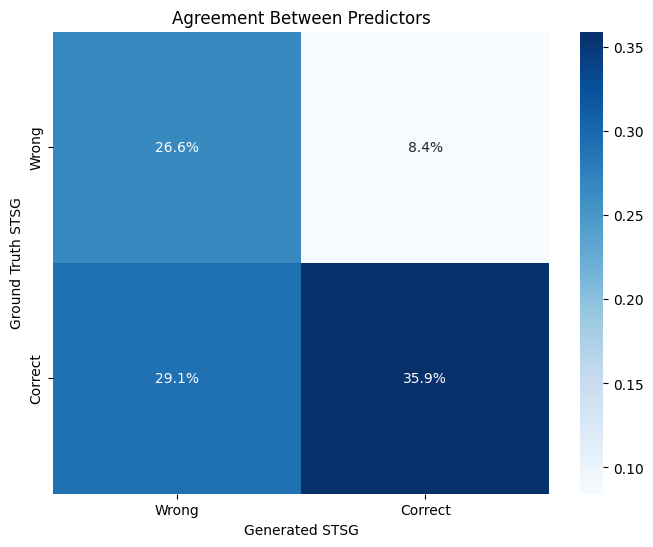

In [81]:
gt_stsg_correct = (eval_df['text'] == eval_df['gt_stsg_pred']).astype(int).values
gen_stsg_correct = (eval_df['text'] == eval_df['gen_stsg_pred']).astype(int).values

cm = confusion_matrix(gt_stsg_correct, gen_stsg_correct)
cm_norm = cm.astype('float') / cm.sum()

plt.figure(figsize=(8, 6))
sns.heatmap(
    cm_norm, annot=True, fmt='.1%', cmap='Blues',
    xticklabels=['Wrong', 'Correct'], 
    yticklabels=['Wrong', 'Correct'])

plt.xlabel('Generated STSG')
plt.ylabel('Ground Truth STSG')
plt.title('Agreement Between Predictors')
plt.show()


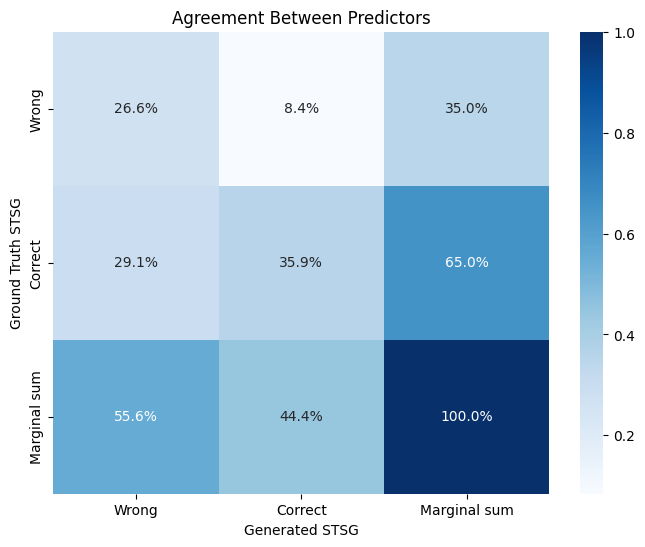

In [82]:
gt_stsg_correct = (eval_df['text'] == eval_df['gt_stsg_pred']).astype(int).values
gen_stsg_correct = (eval_df['text'] == eval_df['gen_stsg_pred']).astype(int).values

cm = confusion_matrix(gt_stsg_correct, gen_stsg_correct)
cm_norm = cm.astype('float') / cm.sum()

extended_matrix = np.zeros((cm.shape[0]+1,cm.shape[1]+1 ))
extended_matrix[:-1, :-1] = cm_norm
extended_matrix[:-1,-1] = cm_norm.sum(axis=1) # sum the rows (i.e. sum passing by columns a[0][i] for i...)
extended_matrix[-1,:-1] = cm_norm.sum(axis=0)
extended_matrix[-1, -1] = 1.0

plt.figure(figsize=(8, 6))
sns.heatmap(
    extended_matrix, annot=True, fmt='.1%', cmap='Blues',
    xticklabels=['Wrong', 'Correct', 'Marginal sum'], 
    yticklabels=['Wrong', 'Correct', 'Marginal sum'])

plt.xlabel('Generated STSG')
plt.ylabel('Ground Truth STSG')
plt.title('Agreement Between Predictors')
plt.show()


In [83]:
wrong_wrong_mask = (gt_stsg_correct == 0) & (gen_stsg_correct == 0)
wrong_wrong_df = eval_df[wrong_wrong_mask]

wrong_but_agree = (wrong_wrong_df['gt_stsg_pred'] == wrong_wrong_df['gen_stsg_pred']).astype(int)


In [84]:
# Ground truth (0 = different wrong predictions, 1 = same wrong prediction)
y_true = np.ones_like(wrong_but_agree)  # (Assuming we want to measure agreement)

# Since we're only checking agreement, we can just count matches vs mismatches
print("Sub-Confusion Matrix for Wrong-Wrong Cases:")
print(pd.crosstab(
    wrong_but_agree,
    columns=['Prediction Agreement'],
    rownames=['Same Wrong Prediction?']
))


Sub-Confusion Matrix for Wrong-Wrong Cases:
col_0                   Prediction Agreement
Same Wrong Prediction?                      
0                                        122
1                                        196


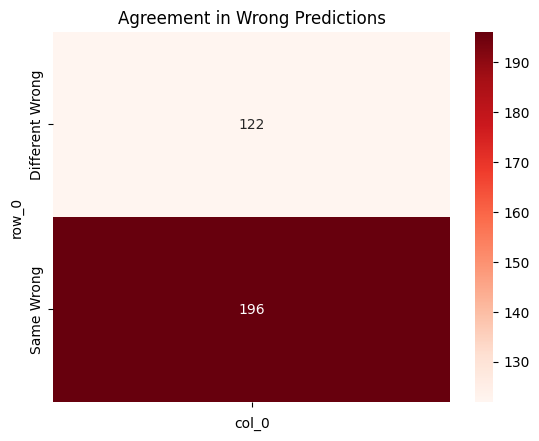

In [85]:
sns.heatmap(
    pd.crosstab(wrong_but_agree, columns=['']),
    annot=True, fmt='d', cmap='Reds',
    xticklabels=[''],
    yticklabels=['Different Wrong', 'Same Wrong']
)
plt.title('Agreement in Wrong Predictions')
plt.show()


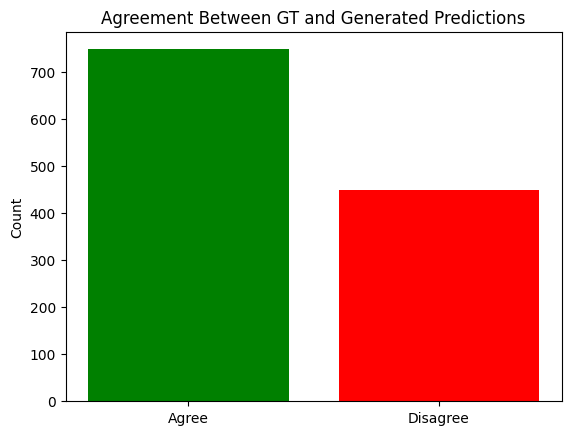

In [86]:
agreement = np.sum(gt_stsg_correct == gen_stsg_correct)
disagreement = len(gt_stsg_correct) - agreement

plt.bar(['Agree', 'Disagree'], [agreement, disagreement], color=['green', 'red'])
plt.title('Agreement Between GT and Generated Predictions')
plt.ylabel('Count')
plt.show()


## Manual analysis

In [87]:
STAR_DATA_PATH = WORK_DIR / "data/datasets/STAR/STAR_annotations/STAR_val.json"
GT_STSG_PATH = WORK_DIR / "data/datasets/STAR_QA_and_stsg_val.json"
GEN_STSG_PATH = WORK_DIR / "outputs/gen_stsg_gemma3:12b-it-qat_20250522_14:30_99.jsonl"


In [88]:
user_prompt_format = None 
with open(WORK_DIR / "data/prompts/zero-shot-cot/MCQ_user_prompt_ZS_CoT_v2.txt") as f:
    user_prompt_format = f.read()
    
pformatter = prompt_formatters.MCQPrompt(user_prompt_format)


In [89]:
gt_dataset = STARDataset(
    qa_file_path=STAR_DATA_PATH,
    prompt_formatter=pformatter,
    stsg_file_path=GT_STSG_PATH
)



Dataset Statistics:
QA File: STAR_val.json
Number of QA samples: 7098
QA sample keys: question_id, question, video_id, start, end, answer, question_program, choices, situations, stsg

STSG File: STAR_QA_and_stsg_val.json
Number of unique video IDs with STSG: 7098



In [90]:
gen_dataset = STARDataset(
    qa_file_path=STAR_DATA_PATH,
    prompt_formatter=pformatter,
    stsg_file_path=GEN_STSG_PATH
)



Dataset Statistics:
QA File: STAR_val.json
Number of QA samples: 1694
QA sample keys: question_id, question, video_id, start, end, answer, question_program, choices, situations, stsg

STSG File: gen_stsg_gemma3:12b-it-qat_20250522_14:30_99.jsonl
Number of unique video IDs with STSG: 799



In [91]:
gt_dataset_df = pd.DataFrame([i for i in gt_dataset])
gen_dataset_df = pd.DataFrame([i for i in gen_dataset])

gt_dataset_df.set_index("question_id", inplace=True)
gen_dataset_df.set_index("question_id", inplace=True)


### GT correct - Gen Wrong

Analysis on some samples where using the ground-truth STSG leads to a correct answer, meanwhile using the generated STSG leads to a wrong one

In [92]:
correct_wrong_mask = (gt_stsg_correct == 1) & (gen_stsg_correct == 0)
correct_wrong_df = eval_df[correct_wrong_mask]

ids = correct_wrong_df.index.to_list()


In [93]:
def compact_print_qa_analysis(idx, gt_dataset_df, eval_df):
    question = gt_dataset_df.loc[idx]['question']
    gt_answer = gt_dataset_df.loc[idx]['answer'].lower()
    gt_stsg_pred = eval_df.loc[idx]['gt_stsg_pred']
    gen_stsg_pred = eval_df.loc[idx]['gen_stsg_pred']
    
    gt_status = '[CORRECT]' if gt_stsg_pred== gt_answer else '[WRONG]'
    gen_status = '[CORRECT]' if gen_stsg_pred == gt_answer else '[WRONG]'
    
    print(f"\n┌─ Sample: {str(idx)} " + "─" * (80 - len(str(idx))))
    print(f"│")
    print(f"│ Question:")
    print(f"│    {question}")
    print(f"│")
    print(f"│ Ground Truth:")
    print(f"|    {gt_answer}")
    print(f"│")
    print(f"│ Model Predictions:")
    print(f"│    GT-STSG:  {gt_stsg_pred} {gt_status}")
    print(f"│    Gen-STSG: {gen_stsg_pred} {gen_status}")
    print(f"│")
    print("└" + "─" * 85)


### Ex. 1

In this example the error is caused by a lack of the necessary information in the generated STSG.  
Looking at the generated STSG, as the LM says, we can't see an action mentioning the man cleaning the table or the `kitchen countertop` as described in the STSG description.

In [94]:
idx = ids.pop()
idx


'Feasibility_T6_1453'

In [95]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Feasibility_T6_1453 ─────────────────────────────────────────────────────────────
│
│ Question:
│    What is the person able to do after taking the towel?
│
│ Ground Truth:
|    wash the table.
│
│ Model Predictions:
│    GT-STSG:  wash the table. [CORRECT]
│    Gen-STSG: open the bag. [WRONG]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [96]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Let's analyze the Spatio-Temporal Scene Graph (STSG) to determine what the person is doing after taking the towel.

1. **Identify relevant relationships:** The STSG contains many instances of "person - holding - towel" and "person - wiping - table". These relationships indicate actions performed by the person.

2. **Look for actions immediately following towel holding:** We need to find instances where a person is holding the towel *and* immediately performing another action.

3. **Examine the graph:**  Several instances show "person - holding - towel" followed by "person - wiping - table". This suggests the person is using the towel to wipe the table.

4. **Consider the alternatives:**
   * A. Wash the table. - This aligns with the observed action of wiping the table with the towel.
   * B. Take the box. - No evidence of taking a box.
   * C. Put down the phone/camera. - No evidence of this.
   * D. Open the bag. - No evidence of this.

Therefore, the most accurate answer is A.

**Fin

In [97]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000227
Subgraph:
	 Actions:
		 take a towel/s from somewhere
	 Relationships:
		 person  ----  on_the_side_of  ----  table
		 person  ----  holding  ----  towel
		 person  ----  in_front_of  ----  towel
		 person  ----  holding  ----  bag
		 person  ----  in_front_of  ----  bag


1 Frame ID: 000237
Subgraph:
	 Actions:
		 take a towel/s from somewhere
	 Relationships:
		 person  ----  in_front_of  ----  table
		 person  ----  in_front_of  ----  towel
		 person  ----  holding  ----  bag
		 person  ----  in_front_of  ----  bag


2 Frame ID: 000251
Subgraph:
	 Actions:
		 take a towel/s from somewhere
	 Relationships:
		 person  ----  in_front_of  ----  towel
		 person  ----  in_front_of  ----  bag


3 Frame ID: 000257
Subgraph:
	 Actions:
		 take a towel/s from somewhere
	 Relationships:
		 person  ----  in_front_of  ----  table
		 person  ----  in_front_of  ----  bag


4 Frame ID: 000268
Subgraph:
	 Actions:
		 take a towel/s from somewhere
	 Relationships:
		 person  ----  

In [98]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the scene graph and answer the question step-by-step.

**1. Question Interpretation:**

The question asks what the person (young man) is able to do *after* holding a towel. The scene graph describes a sequence of actions and objects in a kitchen environment. We need to find an action that logically follows the act of holding a towel.

**2. STSG Analysis:**

Let’s examine the final frame (Frame 4) of the scene graph. The young man is holding a “white_bag” and “interacting_with a digital_scale” on the “kitchen_countertop”. The scene graph shows the young man holding a white bag and interacting with a digital scale.  The previous frames show the young man washing plates and bowls, using a dishcloth, and generally cleaning.  The towel is not explicitly mentioned in the scene graph, but the context suggests he’s likely cleaning.

**3. Alternative Evaluation:**

*   **A. Wash the table:** The scene graph doesn’t show the table being dirty or the young man washing it.
*   

In [99]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:


man ---- standing_on ---- countertop
man ---- holding ---- spatula
stove ---- on ---- countertop
pots ---- surrounding ---- stove
sink ---- next_to ---- stove
sink ---- on ---- countertop
faucet ---- attached_to ---- sink
wall_tiles ---- behind ---- stove
wall_tiles ---- behind ---- sink
light_fixture ---- above ---- stove
window ---- above ---- sink
building_exterior ---- visible_through ---- window
electrical_outlet ---- on ---- wall
man ---- near ---- pots
man ---- looking_at ---- stove
countertop ---- below ---- cabinets

Frame 1:


young_man ---- standing_on ---- kitchen_countertop
young_man ---- holding ---- spatula
young_man ---- preparing ---- vegetables
kitchen_countertop ---- has_sink ---- sink
sink ---- has_faucet ---- faucet
kitchen_countertop ---- has_stove ---- stove
stove ---- has_burner ---- burner
stove ---- has_pot ---- pot
pot ---- on_top_of ---- burner
vegetables ---- on_top_of ---- cutting_board
cutting_board ---- on_top_of ---- kitchen_countertop
kitch

In [100]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  7.3s - 12.9s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. 2

As the example before, even in this case the generated STSG is not descriptive enough. The clothes, which are essential in answering the question, aren't mentioned a single time in the STSG.

In [101]:
idx = ids.pop()
idx


'Feasibility_T6_978'

In [102]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Feasibility_T6_978 ──────────────────────────────────────────────────────────────
│
│ Question:
│    What is the person able to do after tidying up the blanket?
│
│ Ground Truth:
|    put down the clothes.
│
│ Model Predictions:
│    GT-STSG:  put down the clothes. [CORRECT]
│    Gen-STSG: open the laptop. [WRONG]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [103]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph to answer the question: "What is the person able to do after tidying up the blanket?".

**Step 1: Identify Relevant Actions & Relationships**

The question asks about what the person *does* after tidying up the blanket. We need to find actions related to tidying up and the objects involved. The key phrases in the STSG related to this are:

*   `person - holding - blanket`
*   `person - sitting_on - sofa/couch`
*   The subsequent actions involving clothes, sandwich, and dishes.

**Step 2: Trace the Scene Graph for Relevant Actions**

The STSG describes a scene where a person is primarily interacting with a sofa/couch, clothes, a blanket, and eventually a sandwich and dishes. The core activity is the person sitting on the sofa/couch while handling these items. The graph shows the person repeatedly holding, in front of, sitting on, behind, beneath, and leaning on the sofa/couch and the blanket.

**Step 3: Determine the Likely Action**

G

In [104]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000106
Subgraph:
	 Actions:
		 tidy up a blanket/s
	 Relationships:
		 person  ----  holding  ----  clothes
		 person  ----  in_front_of  ----  clothes
		 person  ----  sitting_on  ----  sofa/couch
		 person  ----  behind  ----  sofa/couch


1 Frame ID: 000120
Subgraph:
	 Actions:
		 tidy up a blanket/s
	 Relationships:
		 person  ----  holding  ----  clothes
		 person  ----  in_front_of  ----  clothes
		 person  ----  sitting_on  ----  sofa/couch
		 person  ----  beneath  ----  sofa/couch
		 person  ----  behind  ----  sofa/couch
		 person  ----  holding  ----  blanket
		 person  ----  in_front_of  ----  blanket


2 Frame ID: 000137
Subgraph:
	 Actions:
		 tidy up a blanket/s
	 Relationships:
		 person  ----  holding  ----  clothes
		 person  ----  in_front_of  ----  clothes
		 person  ----  sitting_on  ----  sofa/couch
		 person  ----  behind  ----  sofa/couch
		 person  ----  beneath  ----  sofa/couch


3 Frame ID: 000167
Subgraph:
	 Actions:
		 tidy up a blanket/s
	 Rel

In [105]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the question and the scene graph to determine the most likely answer.

**1. Question Interpretation:**

The question asks what the person (presumably the woman) is able to do *after* tidying up the blanket. Tidying up the blanket implies a state of order and cleanliness. We need to find an action the woman can perform in this state.

**2. STSG Analysis:**

Let’s examine the scene graphs to understand the current state and potential actions.

*   **Frame 0-4:** The scene depicts a living room with a woman, sofa, blanket, and various objects. The blanket is draped over the sofa. The question asks about what she can do *after* tidying it up.
*   **Frame 0:** The blanket is draped over the sofa.
*   **Frame 1-4:** The scene graph shows the blanket being tidied up (covered by a sheet in Frame 4).
*   **Frame 4:** The woman is sitting on the sofa, holding a tablet.

**3. Alternative Evaluation:**

*   **A. Open the laptop.** – The scene graph doesn't show a laptop or any 

In [106]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:


woman ---- holding ---- white_plate
white_plate ---- contains ---- food_on_plate
woman ---- sitting_on ---- sofa
sofa ---- has_cushions ---- sofa_cushions
sofa_cushions ---- patterned ---- patterned_design
sofa ---- in_front_of ---- wall
wall ---- behind ---- sofa
wall ---- has_curtains ---- curtains
wall ---- has_picture_frame ---- picture_frame
picture_frame ---- on_top_of ---- sofa
light_fixture ---- above ---- woman
light_fixture ---- attached_to ---- ceiling
cabinet ---- to_right_of ---- woman
cabinet ---- displays ---- decorative_items
floor ---- below ---- woman
floor ---- below ---- sofa

Frame 1:

woman ---- sitting_on ---- sofa
sofa ---- has_cushion ---- cushion
cushion ---- patterned_with ---- floral_pattern
woman ---- holding ---- plate
woman ---- holding ---- fork
plate ---- in_front_of ---- woman
fork ---- in_front_of ---- woman
sofa ---- positioned_in_front_of ---- cabinet
cabinet ---- located_behind ---- sofa
cabinet ---- has_shelf ---- shelf
shelf ---- disp

Looking at the mentioned generated STSG we can't see an action mentioning the man cleaning the table or the `kitchen countertop` as described in the STSG description.

In [107]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  3.0s - 8.1s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. 3

The reason why the generated STSG leads to a misprediction is the same as the above examples, the essential object in determining the answer is not mentioned in the Graph, i.e. the box or shoe-box.

**Note**: An Error in the ground truth. The STSG reports a relationship woman - wearing - show, which is not visible in the video and considering this is a Feasibility question (what a person is able to do), therefore this tuple should not be present in the Graph.

In [108]:
idx = ids.pop()
idx


'Feasibility_T6_709'

In [109]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Feasibility_T6_709 ──────────────────────────────────────────────────────────────
│
│ Question:
│    What is the person able to do after putting down the pillow?
│
│ Ground Truth:
|    hold the food.
│
│ Model Predictions:
│    GT-STSG:  hold the food. [CORRECT]
│    Gen-STSG: hold the picture. [WRONG]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [110]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Let's analyze the scene graph to determine what the person is doing after putting down the pillow.

1. **Identify relevant relationships:** We need to find relationships involving "person" and "pillow" that indicate an action *after* the pillow is down. The graph describes various interactions with the pillow: 'touching', 'holding', 'in_front_of'.

2. **Search for actions:**  Looking through the scene graph, we find several instances where the person is interacting with the pillow. Specifically, we see:
   - `['person - holding - pillow', 'person - on_the_side_of - pillow']`
   - `['person - holding - food', 'person - in_front_of - food']`
   - `['person - holding - food', 'person - in_front_of - food']`

3. **Determine the action:** The most relevant action is "holding food" which is directly linked to the "person" and "food" through the relationship "in_front_of".

4. **Evaluate Alternatives:**
   - A. Hold the food. - This aligns with our analysis.
   - B. Sit at the table. - There'

In [111]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000093
Subgraph:
	 Actions:
		 put a pillow somewhere
	 Relationships:
		 person  ----  beneath  ----  sofa/couch
		 person  ----  on_the_side_of  ----  sofa/couch
		 person  ----  in_front_of  ----  pillow


1 Frame ID: 000105
Subgraph:
	 Actions:
		 put a pillow somewhere
	 Relationships:
		 person  ----  beneath  ----  sofa/couch
		 person  ----  on_the_side_of  ----  sofa/couch
		 person  ----  behind  ----  pillow


2 Frame ID: 000106
Subgraph:
	 Actions:
		 put a pillow somewhere
	 Relationships:
		 person  ----  on_the_side_of  ----  sofa/couch
		 person  ----  beneath  ----  sofa/couch
		 person  ----  in_front_of  ----  pillow


3 Frame ID: 000123
Subgraph:
	 Actions:
		 put a pillow somewhere
	 Relationships:
		 person  ----  behind  ----  sofa/couch
		 person  ----  beneath  ----  sofa/couch
		 person  ----  behind  ----  pillow


4 Frame ID: 000136
Subgraph:
	 Actions:
		 put a pillow somewhere
	 Relationships:
		 person  ----  behind  ----  sofa/couch
		 person

In [112]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph and answer the question.

1. **Question Interpretation:** The question asks what the person (the woman) is able to do *after* putting down the pillow. The STSG provides a sequence of frames, and we need to find an action that occurs *after* the pillow is no longer present in the scene.

2. **STSG Analysis:**  I need to examine the frames to see when the pillow is last mentioned and then look for actions that follow. The STSG shows the woman holding a pillow in Frame 3 and Frame 4.  Let’s look at Frame 4. In Frame 4, the woman is sitting on the sofa, holding a dog, and there are items on the coffee table (mug, book, remote control, plant).  There is no mention of the pillow in Frame 4.  The woman is holding a dog.

3. **Alternative Evaluation:**
   * **A. Hold the food:** There is no mention of food in the STSG.
   * **B. Sit at the table:** There is no table described in the STSG.
   * **C. Throw the box:** There is no box mentioned i

In [113]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

woman ---- standing_in_front_of ---- chair
chair ---- positioned_near ---- window
window ---- set_into ---- wall
curtains ---- hanging_in_front_of ---- window
woman ---- positioned_to_the_left_of ---- window
chair ---- positioned_between ---- woman
chair ---- resting_on ---- floor
woman ---- illuminated_by ---- sunlight
sunlight ---- coming_from ---- right
curtains ---- covering ---- window
wall ---- supporting ---- window
floor ---- beneath ---- woman
floor ---- beneath ---- chair
woman ---- casting_shadow_on ---- floor

Frame 1:

woman ---- standing_in_front_of ---- sofa
woman ---- looking_at ---- outside
sofa ---- positioned_in_front_of ---- coffee_table
coffee_table ---- positioned_in_front_of ---- sofa
lamp ---- positioned_to_right_of ---- sofa
lamp ---- positioned_behind ---- coffee_table
curtains ---- covering ---- window
curtains ---- hanging_from ---- rod
rod ---- mounted_on ---- wall
sofa ---- resting_on ---- floor
lamp ---- resting_on ---- floor
woman ---- standin

In [114]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  2.9s - 9.4s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. 4

Same... No relevant information in the scene graph pertaining to the question.

In [115]:
idx = ids.pop()
idx


'Feasibility_T6_483'

In [116]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Feasibility_T6_483 ──────────────────────────────────────────────────────────────
│
│ Question:
│    What is the person able to do after throwing the clothes?
│
│ Ground Truth:
|    open the bag.
│
│ Model Predictions:
│    GT-STSG:  open the bag. [CORRECT]
│    Gen-STSG: hold the pillow. [WRONG]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [117]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Let's analyze the STSG to determine what the person is doing after throwing the clothes. The key here is to identify actions related to "throwing" and what the person is doing *immediately* afterward.

1. **Identify relevant relationships:** The STSG contains many relationships involving "holding" and "throwing" (implicitly). We need to find instances where a person is *throwing* something.

2. **Search for "throwing" actions:**  Looking through the STSG, we find several instances of "person - holding - clothes" and "person - throwing - clothes" (although not explicitly stated, the relationships imply throwing).  Crucially, there are multiple instances of "person - holding - clothes" followed by actions like "person - in_front_of - clothes", "person - on_the_side_of - clothes", "person - beneath - bed", etc. This indicates the person was initially holding clothes.

3. **Consider the immediate aftermath:** The question asks what the person *does after* throwing the clothes. The STSG doe

In [118]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000245
Subgraph:
	 Actions:
		 throw clothes somewhere
	 Relationships:
		 person  ----  holding  ----  clothes
		 person  ----  in_front_of  ----  clothes


1 Frame ID: 000252
Subgraph:
	 Actions:
		 throw clothes somewhere
	 Relationships:
		 person  ----  holding  ----  clothes
		 person  ----  in_front_of  ----  clothes


2 Frame ID: 000334
Subgraph:
	 Actions:
		 throw clothes somewhere
	 Relationships:
		 person  ----  holding  ----  clothes
		 person  ----  on_the_side_of  ----  clothes


3 Frame ID: 000374
Subgraph:
	 Actions:
		 take some clothes from somewhere ,throw clothes somewhere
	 Relationships:
		 person  ----  in_front_of  ----  food


4 Frame ID: 000394
Subgraph:
	 Actions:
		 take some clothes from somewhere ,take a bag from somewhere ,throw clothes somewhere
	 Relationships:
		 person  ----  in_front_of  ----  bag


5 Frame ID: 000403
Subgraph:
	 Actions:
		 take some clothes from somewhere ,take a bag from somewhere ,throw clothes somewhere
	 Relations

In [119]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the scene graph and answer the question.

**1. Question Interpretation:**

The question asks what the person (presumably the woman) is able to do *after* throwing the clothes. The scene graph doesn't explicitly state that clothes are thrown. However, we can infer that the question is asking about an action the woman might perform *after* a change in the scene, possibly related to the removal of clothing.

**2. STSG Analysis:**

The scene graph describes a series of frames depicting a woman in a bedroom setting. We see her interacting with the bed, pillows, and a camera. There’s no mention of throwing clothes. The woman is holding a water bottle in the last frame. The scene focuses on her presence and actions related to the bed and camera.

**3. Alternative Evaluation:**

*   **A. Hold the pillow.** The STSG shows the woman holding a water bottle in the last frame. It also shows her arranging pillows on the bed. Therefore, she is capable of holding a pillow.
*   **B.

In [120]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

woman ---- standing_in_front_of ---- bed
bed ---- positioned_against ---- wall
camera_tripod ---- located_in_front_of ---- woman
camera_tripod ---- located_in_front_of ---- bed
camera ---- attached_to ---- camera_tripod
microphone ---- attached_to ---- camera_tripod
cable ---- connected_to ---- microphone
wall ---- behind ---- bed
wall ---- behind ---- woman
light_fixture ---- mounted_on ---- wall
curtain ---- hanging_on ---- wall
woman ---- facing ---- camera
camera ---- pointing_at ---- woman
bed ---- has ---- pillows
pillows ---- on_top_of ---- bed

Frame 1:

woman ---- looking_at ---- camera
camera ---- attached_to ---- tripod
tripod ---- positioned_in_front_of ---- bed
bed ---- against ---- wall
wall ---- behind ---- bed
window ---- on ---- wall
curtains ---- visible_through ---- window
light_fixture ---- above ---- bed
woman ---- positioned_in_front_of ---- bed
wooden_chair ---- to_left_of ---- bed
microphone ---- attached_to ---- camera
woman ---- wearing ---- dark_to

In [121]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  7.7s - 14.5s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. 5

Same as above.

In [122]:
idx = ids.pop()
idx


'Feasibility_T6_405'

In [123]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Feasibility_T6_405 ──────────────────────────────────────────────────────────────
│
│ Question:
│    What is the person able to do after tidying up the closet/cabinet?
│
│ Ground Truth:
|    throw the clothes.
│
│ Model Predictions:
│    GT-STSG:  throw the clothes. [CORRECT]
│    Gen-STSG: put down the bag. [WRONG]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [124]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Okay, let's analyze the STSG to determine what the person is doing after tidying up the closet/cabinet.

1. **Observe the Scene Graph:** The STSG describes a complex scene with multiple people interacting with various objects – a closet/cabinet, towels, clothes, blankets, a door, and a towel. There are many instances of a person 'holding', 'touching', 'in front of', 'on the side of', and 'behind' these objects.

2. **Identify Relevant Actions:** We need to find actions related to tidying up or putting things away.  Several instances show a person 'holding' and 'putting down' objects. Specifically, there are many instances of a person holding the closet/cabinet, towels, clothes, and blankets.

3. **Look for Actions Related to Disposal/Putting Away:** The key is to find actions that indicate the person is finishing the tidying process. The STSG shows a person repeatedly 'holding' and 'putting down' items.

4. **Evaluate Alternatives:**
   * **A. Eat the medicine:** This is not supported 

In [125]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000506
Subgraph:
	 Actions:
		 tidy up a closet/cabinet
	 Relationships:
		 person  ----  in_front_of  ----  closet/cabinet
		 person  ----  touching  ----  door
		 person  ----  in_front_of  ----  door


1 Frame ID: 000525
Subgraph:
	 Actions:
		 tidy up a closet/cabinet ,hold some clothes ,take some clothes from somewhere
	 Relationships:
		 person  ----  holding  ----  closet/cabinet
		 person  ----  in_front_of  ----  closet/cabinet
		 person  ----  in_front_of  ----  door


2 Frame ID: 000533
Subgraph:
	 Actions:
		 tidy up a closet/cabinet ,hold some clothes ,take some clothes from somewhere
	 Relationships:
		 person  ----  holding  ----  closet/cabinet
		 person  ----  in_front_of  ----  closet/cabinet
		 person  ----  in_front_of  ----  door


3 Frame ID: 000541
Subgraph:
	 Actions:
		 tidy up a closet/cabinet ,hold some clothes ,take some clothes from somewhere
	 Relationships:
		 person  ----  holding  ----  closet/cabinet
		 person  ----  in_front_of  ----  clos

In [126]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the scene graph and answer the question step-by-step.

**1. Question Interpretation:**

The question asks what the person (the woman) is able to do *after* tidying up the closet/cabinet.  Tidying up implies organizing and potentially removing items from the closet. We need to identify an action the woman can perform *after* this organizational activity.

**2. STSG Analysis:**

Let's examine the scene graph to understand the woman's actions and the environment:

*   **Frames 1-4:** The scene depicts a room with a woman, furniture (chairs, rugs, walls, doors, closets), and various objects (clothes, shelves, curtains, a fan, a cityscape).
*   **Frame 1:** The woman is holding a door handle, suggesting she’s interacting with a door.
*   **Frame 2:** The woman is holding near a fan.
*   **Frame 3:** The woman is holding a white t-shirt and is standing in front of a door.
*   **Frame 4:** The woman is carrying a backpack.

The key observation is that in Frame 4, the woman

In [127]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:


woman ---- wearing ---- gray_sweatpants
woman ---- wearing ---- white_t_shirt
woman ---- wearing ---- sandals
woman ---- standing_in_front_of ---- chair
chair ---- against ---- wall
wall ---- has_on ---- picture_frame_1
wall ---- has_on ---- picture_frame_2
wall ---- has_on ---- picture_frame_3
rug ---- on ---- floor
floor ---- covered_with ---- rug
window ---- behind ---- chair
window ---- covered_by ---- curtains
curtains ---- hanging_from ---- curtain_rod (implied)
light_source ---- illuminating ---- scene
shadows ---- cast_by ---- woman
shadows ---- cast_by ---- chair
rug ---- under ---- woman
rug ---- under ---- chair


Frame 1:

woman ---- wearing ---- black_t_shirt
woman ---- wearing ---- gray_leggings
woman ---- standing_on ---- floor
floor ---- covered_by ---- patterned_rug
woman ---- holding ---- door_handle
door_handle ---- attached_to ---- door
door ---- attached_to ---- wall
wall ---- behind ---- woman
door ---- leading_to ---- closet_interior
closet_interior -

In [128]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  16.8s - 24.3s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. I1

Same as above.

In [129]:
len(ids)


343

In [130]:
ids = [i for i in ids if i.startswith('I')]
len(ids)


331

In [131]:
idx = ids.pop()
idx


'Interaction_T4_4607'

In [132]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Interaction_T4_4607 ─────────────────────────────────────────────────────────────
│
│ Question:
│    What did the person do while they were standing on the floor and touching the vacuum?
│
│ Ground Truth:
|    put down the broom.
│
│ Model Predictions:
│    GT-STSG:  put down the broom. [CORRECT]
│    Gen-STSG: threw the broom. [WRONG]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [133]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph (STSG) to answer the question.

1. **Understanding the Question:** The question asks what the person was doing while standing on the floor and touching the vacuum (represented by "broom" in the graph).

2. **Analyzing the SG:** The SG contains multiple instances of "person - standing_on - floor", "person - beneath - floor", and "person - holding - broom". This indicates that many people are standing on the floor and holding a broom.  Crucially, several instances include "person - holding - broom", which directly relates to the action of holding the broom.

3. **Identifying Relevant Relationships:** The key relationships we need to consider are:
   - `person - holding - broom`: This explicitly states the person is holding the broom.

4. **Eliminating Incorrect Alternatives:**
   - A. Washed the cup/glass/bottle: There's no mention of any objects related to washing.
   - B. Closed the door: There's no mention of doors or closing actions

In [134]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000259
Subgraph:
	 Actions:
		 put a broom somewhere
	 Relationships:
		 person  ----  standing_on  ----  floor
		 person  ----  beneath  ----  floor
		 person  ----  holding  ----  broom
		 person  ----  in_front_of  ----  broom


1 Frame ID: 000279
Subgraph:
	 Actions:
		 put a broom somewhere
	 Relationships:
		 person  ----  standing_on  ----  floor
		 person  ----  beneath  ----  floor
		 person  ----  holding  ----  broom
		 person  ----  in_front_of  ----  broom


2 Frame ID: 000286
Subgraph:
	 Actions:
		 put a broom somewhere
	 Relationships:
		 person  ----  standing_on  ----  floor
		 person  ----  beneath  ----  floor
		 person  ----  holding  ----  broom
		 person  ----  in_front_of  ----  broom


3 Frame ID: 000293
Subgraph:
	 Actions:
		 put a broom somewhere
	 Relationships:
		 person  ----  standing_on  ----  floor
		 person  ----  beneath  ----  floor
		 person  ----  holding  ----  broom
		 person  ----  in_front_of  ----  broom


4 Frame ID: 000297
Subgr

In [135]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the question and the scene graph to determine the best answer.

**1. Question Interpretation:**

The question asks: "What did the person do while they were standing on the floor and touching the vacuum?"  This requires us to identify an action the person performed while in a state of standing on the floor and interacting with a vacuum.

**2. STSG Analysis:**

Let's examine the scene graph across the frames, focusing on instances where the person (woman) is standing on the floor and interacting with a vacuum.

*   **Frame 0:** The woman is holding a decorative pole.
*   **Frame 1:** The woman is holding a wooden broom.
*   **Frame 2:** The woman is holding a vacuum cleaner. She is standing in front of a chair.
*   **Frame 3:** The woman is holding a vacuum cleaner.
*   **Frame 4:** The woman is holding a vacuum cleaner.

In all these frames, the woman is holding a vacuum cleaner and standing on the floor.  The key action we need to identify is what she *did* while ho

In [136]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

woman ---- holding ---- wand
wand ---- connected_to ---- hose
hose ---- connected_to ---- canister
canister ---- located_on ---- floor
woman ---- positioned_in_front_of ---- chair
chair ---- located_next_to ---- table
table ---- supporting ---- notebook
notebook ---- containing ---- pages
pen ---- resting_on ---- notebook
woman ---- looking_at ---- notebook
canister ---- behind ---- chair
canister ---- behind ---- table
floor ---- beneath ---- chair
floor ---- beneath ---- table
floor ---- beneath ---- woman
floor ---- beneath ---- canister
wall ---- behind ---- canister
wall ---- behind ---- chair
wall ---- behind ---- table

Frame 1:


woman ---- holding ---- vacuum_wand
vacuum_wand ---- attached_to ---- vacuum_hose
vacuum_hose ---- connected_to ---- vacuum_cleaner
woman ---- standing_in_front_of ---- table
vacuum_cleaner ---- behind ---- table
chair ---- next_to ---- table
woman ---- looking_at ---- notebook_pad
notebook_pad ---- on_top_of ---- table
pen ---- resting_on -

In [137]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  9.5s - 17.6s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. I2

In [138]:
idx = ids.pop()
idx


'Interaction_T4_3826'

In [139]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Interaction_T4_3826 ─────────────────────────────────────────────────────────────
│
│ Question:
│    What did the person do while they were leaning on the chair and standing on the floor?
│
│ Ground Truth:
|    put down the phone/camera.
│
│ Model Predictions:
│    GT-STSG:  put down the phone/camera. [CORRECT]
│    Gen-STSG: opened the box. [WRONG]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [140]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph (STSG) to answer the question.

**1. Understand the Question:**

The question asks what the person was doing while they were "leaning on the chair and standing on the floor."  The STSG doesn't explicitly mention "leaning on the chair," but it does contain information about "person - standing_on - floor" and "person - beneath - floor".  We need to find actions related to standing and potentially interacting with objects beneath them.

**2. Analyze the STSG for Relevant Actions:**

*   The STSG contains multiple instances of "person - standing_on - floor" and "person - beneath - floor". This indicates the person is consistently standing on the floor.
*   Crucially, several instances include "person - holding - phone/camera" or "person - in_front_of - phone/camera" or "person - beneath - phone/camera". This suggests the person is holding or interacting with a phone/camera.

**3. Identify the Most Likely Action:**

Based on the STSG, the 

In [141]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000329
Subgraph:
	 Actions:
		 put a phone/camera somewhere
	 Relationships:
		 person  ----  holding  ----  mirror
		 person  ----  in_front_of  ----  mirror
		 person  ----  holding  ----  phone/camera
		 person  ----  in_front_of  ----  phone/camera
		 person  ----  standing_on  ----  floor
		 person  ----  beneath  ----  floor


1 Frame ID: 000341
Subgraph:
	 Actions:
		 put a phone/camera somewhere
	 Relationships:
		 person  ----  holding  ----  mirror
		 person  ----  in_front_of  ----  mirror
		 person  ----  holding  ----  phone/camera
		 person  ----  in_front_of  ----  phone/camera
		 person  ----  standing_on  ----  floor
		 person  ----  beneath  ----  floor


2 Frame ID: 000363
Subgraph:
	 Actions:
		 put a phone/camera somewhere
	 Relationships:
		 person  ----  holding  ----  mirror
		 person  ----  in_front_of  ----  mirror
		 person  ----  holding  ----  phone/camera
		 person  ----  in_front_of  ----  phone/camera
		 person  ----  standing_on  ----  floor

In [142]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the scene graph and answer the question step-by-step.

**1. Question Interpretation:**

The question asks about the actions of a person who is "leaning on the chair and standing on the floor." We need to identify what that person was doing based on the provided scene graph.

**2. STSG Analysis:**

Let's examine the frames to find relevant information:

*   **Frame 3:**  “woman ---- sitting_on ---- chair” – This shows a woman sitting on a chair.
*   **Frame 4:** “man ---- leaning_on ---- chair” – This explicitly states a man is leaning on a chair.
*   **Frame 4:** “man ---- standing_on ---- floor” – This indicates the man is standing on the floor.
*   **Frame 4:** “man ---- holding ---- object” – This suggests the man is holding something.

**3. Alternative Evaluation:**

*   **A. Took the phone/camera.** – The STSG doesn’t mention anything about a phone or camera.
*   **B. Tidied up the table.** – The STSG shows a plate, fork, and glass on the table, but no action o

In [143]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

man ---- sitting_on ---- chair
man ---- holding ---- hair_dryer
man ---- looking_at ---- mirror
hair_dryer ---- drying ---- man's_hair
hair_dryer ---- connected_to ---- electrical_cord
electrical_cord ---- extending_from ---- hair_dryer
mirror ---- mounted_on ---- wall
sink ---- located_below ---- mirror
towel ---- draped_over ---- chair's_armrest
man ---- surrounded_by ---- water_droplets
sink ---- connected_to ---- faucet
wall ---- behind ---- chair

Frame 1:

man ---- standing_in_front_of ---- sink
man ---- looking_at ---- dog
dog ---- looking_at ---- man
sink ---- located_below ---- mirror
mirror ---- hanging_on ---- wall
wall ---- behind ---- sink
wall ---- behind ---- man
sink ---- connected_to ---- faucet
faucet ---- supporting ---- towel
towel ---- hanging_on ---- faucet
sink ---- located_on ---- floor
floor ---- beneath ---- sink
floor ---- beneath ---- man
floor ---- beneath ---- dog
light_fixture ---- above ---- mirror
pipes ---- running_along ---- wall

Frame 2:


In [144]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  12.4s - 19.7s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

## Correct-Correct samples

In [145]:
correct_correct_mask = (gt_stsg_correct == 1) & (gen_stsg_correct == 1)
correct_correct_df = eval_df[correct_correct_mask]

ids = correct_correct_df.index.to_list()


### Ex. 1

In this example the error is caused by a lack of the necessary information in the generated STSG.  
Looking at the generated STSG, as the LM says, we can't see an action mentioning the man cleaning the table or the `kitchen countertop` as described in the STSG description.

In [146]:
idx = ids.pop()
idx


'Feasibility_T6_1263'

In [147]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Feasibility_T6_1263 ─────────────────────────────────────────────────────────────
│
│ Question:
│    What is the person able to do after closing the refrigerator?
│
│ Ground Truth:
|    take the food.
│
│ Model Predictions:
│    GT-STSG:  take the food. [CORRECT]
│    Gen-STSG: take the food. [CORRECT]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [148]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Let's analyze the scene graph to determine what the person is doing and what actions might be possible.

1. **Identify relevant relationships:** The scene graph describes a person interacting with a refrigerator, blankets, and food. Key relationships include:
   - 'person - holding - blanket'
   - 'person - in_front_of - refrigerator'
   - 'person - touching - refrigerator'
   - 'person - in_front_of - food'

2. **Infer actions:** The graph shows the person is holding a blanket, touching the refrigerator, and in front of food. This suggests they are potentially interacting with these items.

3. **Evaluate alternatives:**
   * **A. Take the paper/notebook:** There's no mention of a paper or notebook in the scene graph.
   * **B. Throw the blanket:** The graph shows the person *holding* a blanket, not throwing it.
   * **C. Take the food:** The person is ‘in_front_of - food’, implying they are potentially taking the food.
   * **D. Open the book:** There's no mention of a book in the sce

In [149]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000538
Subgraph:
	 Actions:
		 close a refrigerator
	 Relationships:
		 person  ----  holding  ----  blanket
		 person  ----  in_front_of  ----  blanket
		 person  ----  in_front_of  ----  refrigerator


1 Frame ID: 000551
Subgraph:
	 Actions:
		 close a refrigerator
	 Relationships:
		 person  ----  in_front_of  ----  refrigerator
		 person  ----  on_the_side_of  ----  refrigerator


2 Frame ID: 000580
Subgraph:
	 Actions:
		 close a refrigerator
	 Relationships:
		 person  ----  holding  ----  blanket
		 person  ----  in_front_of  ----  blanket
		 person  ----  in_front_of  ----  refrigerator
		 person  ----  on_the_side_of  ----  refrigerator


3 Frame ID: 000609
Subgraph:
	 Actions:
		 close a refrigerator
	 Relationships:
		 person  ----  carrying  ----  blanket
		 person  ----  in_front_of  ----  blanket
		 person  ----  on_the_side_of  ----  blanket
		 person  ----  in_front_of  ----  refrigerator
		 person  ----  on_the_side_of  ----  refrigerator


4 Frame ID: 0006

In [150]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the scene graph and answer the question.

**1. Question Interpretation:**

The question asks what the person (the woman) is able to do *after* closing the refrigerator. It’s a simple inference question based on the scene’s context.

**2. STSG Analysis:**

Let’s examine the scene graph to understand the woman’s actions and the environment. The scene graph describes a kitchen setting. We see the woman interacting with a refrigerator, kitchen counter, sink, and other kitchen elements. The graph doesn't explicitly state what she does *after* closing the refrigerator. However, the presence of the kitchen counter, sink, and other appliances suggests she might be preparing food or cleaning.

**3. Alternative Evaluation:**

*   **A. Take the paper/notebook.** The scene graph doesn’t mention any paper or notebook. This option is unsupported.
*   **B. Throw the blanket.** There is no blanket in the scene graph. This option is unsupported.
*   **C. Take the food.** The scene g

In [151]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

woman ---- holding ---- pillow
woman ---- standing_in_front_of ---- bed
woman ---- facing ---- bed
bed ---- has ---- comforter
bed ---- has ---- bed_sheet
pillow ---- touching ---- comforter
bed ---- positioned_next_to ---- chair
chair ---- positioned_to_left_of ---- bed
curtains ---- covering ---- window
curtains ---- positioned_behind ---- bed
window ---- visible_through ---- curtains
floor ---- beneath ---- bed
floor ---- beneath ---- chair
floor ---- beneath ---- woman
wall ---- behind ---- curtains
bed ---- on_top_of ---- floor
chair ---- on_top_of ---- floor
woman ---- on_top_of ---- floor

Frame 1:

woman ---- standing_in_front_of ---- bed
woman ---- leaning_over ---- bed
woman ---- looking_at ---- pillow
bed ---- against ---- wall
pillow ---- on ---- bed
curtain ---- hanging_on ---- wall
light_fixture ---- hanging_from ---- ceiling
floor ---- beneath ---- bed
floor ---- beneath ---- woman
wall ---- behind ---- bed
bed ---- near ---- curtain
light_fixture ---- above -

In [152]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  22.3s - 28.4s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. 2

In [153]:
idx = ids.pop()
idx


'Feasibility_T6_1104'

In [154]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Feasibility_T6_1104 ─────────────────────────────────────────────────────────────
│
│ Question:
│    What is the person able to do after tidying up the clothes?
│
│ Ground Truth:
|    sit on the floor.
│
│ Model Predictions:
│    GT-STSG:  sit on the floor. [CORRECT]
│    Gen-STSG: sit on the floor. [CORRECT]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [155]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph to answer the question: "What is the person able to do after tidying up the clothes?".

1. **Identify Relevant Actions:** The STSG describes a person lying on the floor, interacting with clothes and a towel. The key actions related to tidying up are: lying on the floor, holding clothes, touching clothes, sitting on the floor, and holding a towel.

2. **Look for Sitting Actions:** The STSG contains multiple instances of "person - sitting_on - floor" and "person - sitting_on - floor". This indicates the person is actively sitting on the floor.

3. **Consider the Context:** The scene graph shows the person is lying on the floor, holding clothes and a towel. This suggests they are in a state of rest and potentially organizing or dealing with the items.

4. **Evaluate Alternatives:**
   * **A. Put down the sandwich:** There's no mention of a sandwich in the scene graph.
   * **B. Open the door:** There's no mention of a door.
   * **C. Sit

In [156]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000037
Subgraph:
	 Actions:
		 tidy some clothes
	 Relationships:
		 person  ----  holding  ----  clothes
		 person  ----  in_front_of  ----  clothes
		 person  ----  lying_on  ----  floor
		 person  ----  beneath  ----  floor
		 person  ----  behind  ----  floor


1 Frame ID: 000039
Subgraph:
	 Actions:
		 tidy some clothes
	 Relationships:
		 person  ----  holding  ----  clothes
		 person  ----  in_front_of  ----  clothes
		 person  ----  lying_on  ----  floor
		 person  ----  beneath  ----  floor
		 person  ----  behind  ----  floor


2 Frame ID: 000049
Subgraph:
	 Actions:
		 tidy some clothes
	 Relationships:
		 person  ----  holding  ----  clothes
		 person  ----  in_front_of  ----  clothes
		 person  ----  lying_on  ----  floor
		 person  ----  behind  ----  floor


3 Frame ID: 000058
Subgraph:
	 Actions:
		 tidy some clothes
	 Relationships:
		 person  ----  touching  ----  clothes
		 person  ----  in_front_of  ----  clothes
		 person  ----  lying_on  ----  floor
		

In [157]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the scene graph and answer the question step-by-step.

**1. Question Interpretation:**

The question asks what the person (the woman) is able to do *after* tidying up the clothes.  The scene graph describes a static scene, so we need to infer what actions are possible based on the spatial relationships and the woman's current state.

**2. STSG Analysis:**

The scene graph depicts a woman in various positions – sitting, lying, leaning, and covered by blankets.  She is interacting with objects like chairs, tables, rugs, and a blanket. The scene is illuminated by a light source, and shadows are cast by various objects. The woman is near a bucket, a water bottle, and a chair. The scene suggests a relatively relaxed and possibly cluttered environment.

**3. Alternative Evaluation:**

*   **A. Put down the sandwich.** The scene graph doesn't mention a sandwich or any food items. Therefore, this option is not supported by the STSG.
*   **B. Open the door.** The scene graph

In [158]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

woman ---- sitting_on ---- sofa
woman ---- leaning_against ---- sofa
sofa ---- next_to ---- chair
chair ---- next_to ---- sofa
sofa ---- in_front_of ---- table
table ---- behind ---- sofa
table ---- supporting ---- plant
plant ---- in_pot ---- pot
pot ---- on_top_of ---- table
sofa ---- covered_with ---- cushion
cushion ---- on_top_of ---- sofa
sofa ---- in_front_of ---- wall
wall ---- behind ---- sofa
floor ---- beneath ---- sofa
floor ---- beneath ---- chair
floor ---- beneath ---- table

Frame 1:

woman ---- wearing ---- red_dress
woman ---- sitting_on ---- wooden_chair
wooden_chair ---- next_to ---- table
table ---- in_front_of ---- wall
glass_of_water ---- on_top_of ---- table
woman ---- holding ---- glass_of_water
shadows ---- cast_by ---- woman
shadows ---- cast_by ---- wooden_chair
shadows ---- cast_by ---- table
light_source ---- illuminating ---- scene
floor ---- beneath ---- woman
floor ---- beneath ---- wooden_chair
floor ---- beneath ---- table
wall ---- behind 

In [159]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  1.9s - 11.8s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. I1

Analyzing interaction questions.

In [160]:
ids = [i for i in correct_correct_df.index.to_list() if i.startswith('I')]
len(ids)


412

In [161]:
idx = ids[-1]
idx


'Interaction_T4_4470'

In [162]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Interaction_T4_4470 ─────────────────────────────────────────────────────────────
│
│ Question:
│    What did the person do while they were standing on the floor and sitting on the chair?
│
│ Ground Truth:
|    sat at the table.
│
│ Model Predictions:
│    GT-STSG:  sat at the table. [CORRECT]
│    Gen-STSG: sat at the table. [CORRECT]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [163]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Okay, let's analyze the scene graph and answer the question.

**1. Understanding the Scene Graph:**

The scene graph describes the spatial relationships between people and objects. Key relationships include:

*   `on_the_side_of`:  One object is beside another.
*   `standing_on`: A person is standing on a surface.
*   `beneath`: One object is below another.
*   `in_front_of`: One object is in front of another.
*   `behind`: One object is behind another.

**2.  Analyzing the Question:**

The question asks what the person *did* while they were *standing on the floor* and *sitting on the chair*.  The scene graph doesn't explicitly state what the person was doing. However, it does describe the person's location: standing on the floor.

**3.  Interpreting the Scene Graph in Relation to the Question:**

The scene graph shows multiple people standing on the floor.  It doesn't provide information about sitting on a chair.  The question combines standing on the floor *and* sitting on the chair,

In [164]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000281
Subgraph:
	 Actions:
		 sit at a table
	 Relationships:
		 person  ----  on_the_side_of  ----  table
		 person  ----  standing_on  ----  floor
		 person  ----  beneath  ----  floor


1 Frame ID: 000289
Subgraph:
	 Actions:
		 sit at a table
	 Relationships:
		 person  ----  in_front_of  ----  table
		 person  ----  standing_on  ----  floor
		 person  ----  beneath  ----  floor


2 Frame ID: 000296
Subgraph:
	 Actions:
		 sit at a table
	 Relationships:
		 person  ----  in_front_of  ----  table
		 person  ----  standing_on  ----  floor
		 person  ----  beneath  ----  floor


3 Frame ID: 000302
Subgraph:
	 Actions:
		 sit at a table
	 Relationships:
		 person  ----  in_front_of  ----  table
		 person  ----  standing_on  ----  floor
		 person  ----  behind  ----  floor


4 Frame ID: 000322
Subgraph:
	 Actions:
		 sit at a table
	 Relationships:
		 person  ----  in_front_of  ----  table


5 Frame ID: 000335
Subgraph:
	 Actions:
		 sit at a table
	 Relationships:
		 perso

In [165]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the scene graph and answer the question step-by-step.

**1. Question Interpretation:**

The question asks what the person (referred to as "woman") was doing while they were sitting on the chair and on the floor. It’s looking for an action performed during that specific state.

**2. STSG Analysis:**

*   **Frame 0:** The woman is sitting on an office chair.
*   **Frame 1:** The woman is sitting on an office chair.
*   **Frame 2:** The woman is sitting on an office chair.
*   **Frame 3:** The woman is sitting on a chair.

The scene graph consistently shows the woman sitting on a chair (or a similar type of chair) and on the floor. There's no indication of her standing. The scene graph describes her *sitting* on the chair and on the floor.

**3. Alternative Evaluation:**

*   **A. Took the food.** The scene graph doesn't mention anything about food or taking it.
*   **B. Tidied up the table.** The scene graph describes a room with a desk and a laptop, but no table.
*  

In [166]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

woman ---- sitting_on ---- office_chair
office_chair ---- has_wheels ---- floor
woman ---- in_front_of ---- desk
desk ---- supporting ---- laptop
laptop ---- open_on ---- desk
woman ---- looking_at ---- laptop
wall ---- behind ---- desk
picture_frame ---- hanging_on ---- wall
light_source ---- illuminating ---- desk
light_source ---- illuminating ---- woman
floor ---- beneath ---- office_chair
floor ---- beneath ---- desk
desk ---- adjacent_to ---- wall
woman ---- within_room ---- room

Frame 1:

woman ---- sitting_on ---- office_chair
office_chair ---- positioned_in_front_of ---- wooden_door
wooden_door ---- located_behind ---- office_chair
office_chair ---- resting_on ---- floor
floor ---- beneath ---- woman
floor ---- beneath ---- office_chair
floor ---- beneath ---- wooden_door
picture_frame ---- hanging_on ---- wall
wall ---- behind ---- wooden_door
wall ---- supporting ---- picture_frame
woman ---- facing ---- wooden_door
shadows ---- cast_by ---- office_chair
shadows 

In [167]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  9.2s - 17.0s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

## Ex I2

In [168]:
idx = ids.pop()
idx


'Interaction_T4_4470'

In [169]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Interaction_T4_4470 ─────────────────────────────────────────────────────────────
│
│ Question:
│    What did the person do while they were standing on the floor and sitting on the chair?
│
│ Ground Truth:
|    sat at the table.
│
│ Model Predictions:
│    GT-STSG:  sat at the table. [CORRECT]
│    Gen-STSG: sat at the table. [CORRECT]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [170]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Okay, let's analyze the scene graph and answer the question.

**1. Understanding the Scene Graph:**

The scene graph describes the spatial relationships between people and objects. Key relationships include:

*   `on_the_side_of`:  One object is beside another.
*   `standing_on`: A person is standing on a surface.
*   `beneath`: One object is below another.
*   `in_front_of`: One object is in front of another.
*   `behind`: One object is behind another.

**2.  Analyzing the Question:**

The question asks what the person *did* while they were *standing on the floor* and *sitting on the chair*.  The scene graph doesn't explicitly state what the person was doing. However, it does describe the person's location: standing on the floor.

**3.  Interpreting the Scene Graph in Relation to the Question:**

The scene graph shows multiple people standing on the floor.  It doesn't provide information about sitting on a chair.  The question combines standing on the floor *and* sitting on the chair,

In [171]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000281
Subgraph:
	 Actions:
		 sit at a table
	 Relationships:
		 person  ----  on_the_side_of  ----  table
		 person  ----  standing_on  ----  floor
		 person  ----  beneath  ----  floor


1 Frame ID: 000289
Subgraph:
	 Actions:
		 sit at a table
	 Relationships:
		 person  ----  in_front_of  ----  table
		 person  ----  standing_on  ----  floor
		 person  ----  beneath  ----  floor


2 Frame ID: 000296
Subgraph:
	 Actions:
		 sit at a table
	 Relationships:
		 person  ----  in_front_of  ----  table
		 person  ----  standing_on  ----  floor
		 person  ----  beneath  ----  floor


3 Frame ID: 000302
Subgraph:
	 Actions:
		 sit at a table
	 Relationships:
		 person  ----  in_front_of  ----  table
		 person  ----  standing_on  ----  floor
		 person  ----  behind  ----  floor


4 Frame ID: 000322
Subgraph:
	 Actions:
		 sit at a table
	 Relationships:
		 person  ----  in_front_of  ----  table


5 Frame ID: 000335
Subgraph:
	 Actions:
		 sit at a table
	 Relationships:
		 perso

In [172]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the scene graph and answer the question step-by-step.

**1. Question Interpretation:**

The question asks what the person (referred to as "woman") was doing while they were sitting on the chair and on the floor. It’s looking for an action performed during that specific state.

**2. STSG Analysis:**

*   **Frame 0:** The woman is sitting on an office chair.
*   **Frame 1:** The woman is sitting on an office chair.
*   **Frame 2:** The woman is sitting on an office chair.
*   **Frame 3:** The woman is sitting on a chair.

The scene graph consistently shows the woman sitting on a chair (or a similar type of chair) and on the floor. There's no indication of her standing. The scene graph describes her *sitting* on the chair and on the floor.

**3. Alternative Evaluation:**

*   **A. Took the food.** The scene graph doesn't mention anything about food or taking it.
*   **B. Tidied up the table.** The scene graph describes a room with a desk and a laptop, but no table.
*  

In [173]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

woman ---- sitting_on ---- office_chair
office_chair ---- has_wheels ---- floor
woman ---- in_front_of ---- desk
desk ---- supporting ---- laptop
laptop ---- open_on ---- desk
woman ---- looking_at ---- laptop
wall ---- behind ---- desk
picture_frame ---- hanging_on ---- wall
light_source ---- illuminating ---- desk
light_source ---- illuminating ---- woman
floor ---- beneath ---- office_chair
floor ---- beneath ---- desk
desk ---- adjacent_to ---- wall
woman ---- within_room ---- room

Frame 1:

woman ---- sitting_on ---- office_chair
office_chair ---- positioned_in_front_of ---- wooden_door
wooden_door ---- located_behind ---- office_chair
office_chair ---- resting_on ---- floor
floor ---- beneath ---- woman
floor ---- beneath ---- office_chair
floor ---- beneath ---- wooden_door
picture_frame ---- hanging_on ---- wall
wall ---- behind ---- wooden_door
wall ---- supporting ---- picture_frame
woman ---- facing ---- wooden_door
shadows ---- cast_by ---- office_chair
shadows 

In [174]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  9.2s - 17.0s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw